# Additional Pipelines

## 모듈 임포트

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

import torch
from diffusers import AutoPipelineForImage2Image
from diffusers.utils import load_image, make_image_grid


# We'll be exploring a number of pipelines today!
from diffusers import (
    AutoPipelineForImage2Image,
    AutoPipelineForInpainting
)

# StableDiffusionPipeline,
# StableDiffusionImg2ImgPipeline,
# StableDiffusionInpaintPipeline,




In [ ]:
torch.__version__

'2.4.1+cu121'

## 이미지 준비

- Image to Image 작업과  Image Inpaint 작업을 할 때 사용할 기본 이미지 준비

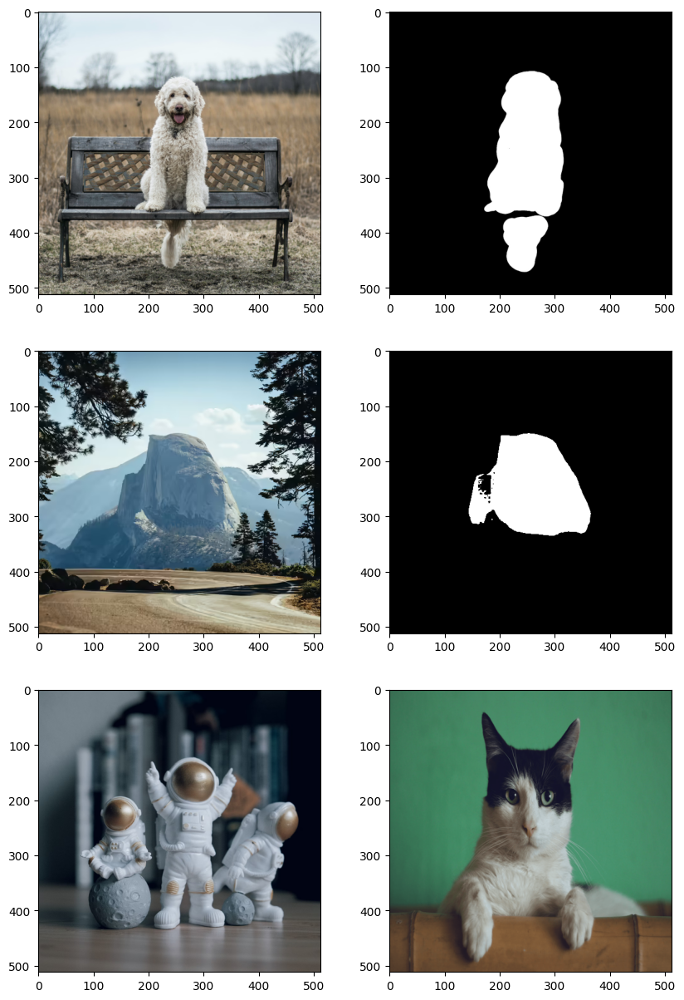

In [ ]:
bench_dog_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
bench_dog_mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"
bench_dog_img = load_image(bench_dog_url).resize((512, 512))
bench_dog_mask = load_image(bench_dog_mask_url).resize((512, 512))

mountain_url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png"
mountain_mask_url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png"
mountain_img = load_image(mountain_url).resize((512, 512))
mountain_mask = load_image(mountain_mask_url).resize((512, 512))

astro_url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/img2img-init.png"
astro_img = load_image(astro_url).resize((512, 512))

cat_url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/cat.png"
cat_img = load_image(cat_url).resize((512, 512))

fig, axs = plt.subplots(figsize=(10,15), nrows=3, ncols=2)

axs[0,0].imshow(bench_dog_img)
axs[0,1].imshow(bench_dog_mask)
axs[1,0].imshow(mountain_img)
axs[1,1].imshow(mountain_mask)
axs[2,0].imshow(astro_img)
axs[2,1].imshow(cat_img)

# save image
bench_dog_img.save('bench_dog.png')
bench_dog_mask.save('bench_dog_mask.png')
mountain_img.save('mountain.png')
mountain_mask.save('mountain_mask.png')
astro_img.save("astro.png")
cat_img.save("cat.png")

## Image to Image

- 노이즈 제거 시작점으로 완전 노이즈 latent를 입력하지 않고 기준이 되는 이미지를 인코딩하여 latent로 만들고 여기에 노이즈를 추가해서 입력으로 사용

- 입력 노이즈에 기준 이미지의 정보가 들어 있기 때문에 확률적으로 기준 이미지 근처의 이미지를 생성하게 됨

- strength: 기준 이미지에 노이즈를 얼마나 많이 추가할지 결정

   - 1에 가까우면 최대한 노이즈를 많이 추가하므로 기준 이미지가 무시되고
   - 0에 가까우면 기준 이미지가 생성됨

- 이 태스크는 이미지 생성 모델을 별도로 추가 학습할 필요 없음

### Kandinsky 2.2

- 러시아 Sber AI에서 만든 모델로 3.1까지 릴리즈
- 홈페이지: https://ai-forever.github.io/Kandinsky-3/K31/
- 3.0버전 기술문서: http://arxiv.org/pdf/2312.03511
  - 이 문서 섹션 6.1에 디퓨전 모델을 인페인팅 모델로 추가 학습하는 내용 설명됨


In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

- `AutoPipelineForImage2Image`로 파이프라인을 생성하고 입력으로 프롬프트와 초기 이미지를 주고 Image to Image 태스크 실험

In [ ]:
img2img_pipe_kd22 = AutoPipelineForImage2Image.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder",
    # "kandinsky-community/kandinsky-2-2-decoder-inpaint",
    torch_dtype=torch.float16,
    use_safetensors=True
)#.to(device)

# Unet, VAE, Text Encoder만 GPU에 남기고 파이프라인 나머지 요소는 CPU로 보내 메모리 절약
# 도움말: https://huggingface.co/docs/diffusers/optimization/memory#model-offloading
img2img_pipe_kd22.enable_model_cpu_offload()

# remove following line if xFormers is not installed or you have PyTorch 2.0 or higher installed
# img2img_pipe_kd22.enable_xformers_memory_efficient_attention()

Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/home/metamath/miniconda3/envs/ai/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/25 [00:00<?, ?it/s]

/home/metamath/miniconda3/envs/ai/lib/python3.10/site-packages/diffusers/pipelines/kandinsky2_2/pipeline_kandinsky2_2_img2img.py:276: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider use `callback_on_step_end`
  deprecate(


  0%|          | 0/15 [00:00<?, ?it/s]

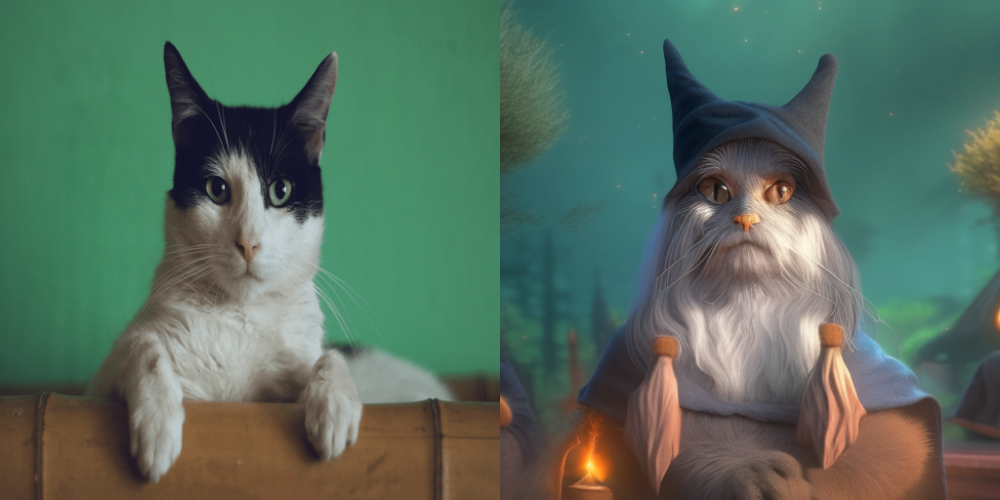

In [ ]:
prompt = "cat wizard, gandalf, lord of the rings, detailed, fantasy, cute, adorable, Pixar, Disney, 8k"

generator = torch.Generator(device="cuda").manual_seed(0)
image = img2img_pipe_kd22(prompt,
                 image=cat_img, # start image
                 strength=0.15, # 0.01, 1.0으로 추가 실험해볼 것
                 generator=generator).images[0]

make_image_grid([cat_img, image], rows=1, cols=2)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

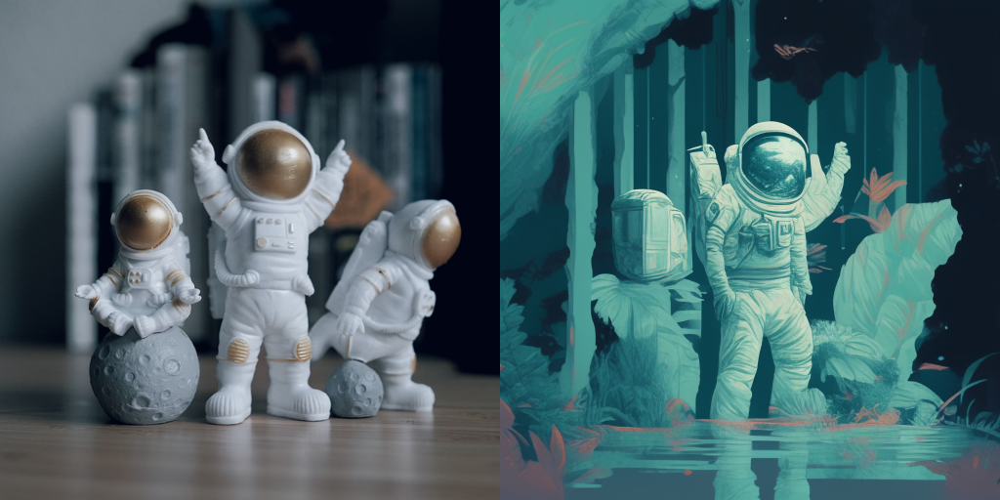

In [ ]:
prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

generator = torch.Generator(device="cuda").manual_seed(0)
image = img2img_pipe_kd22(prompt,
                      image=astro_img,
                      strength=0.15,
                      generator=generator).images[0]
make_image_grid([astro_img, image], rows=1, cols=2)

### StableDiffusion 1.5

- Stable Diffusion 1.0 (2022년 8월 22일) 모델의 개선 버전

In [ ]:
img2img_pipe_sd15 = AutoPipelineForImage2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)#.to(device)

img2img_pipe_sd15.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

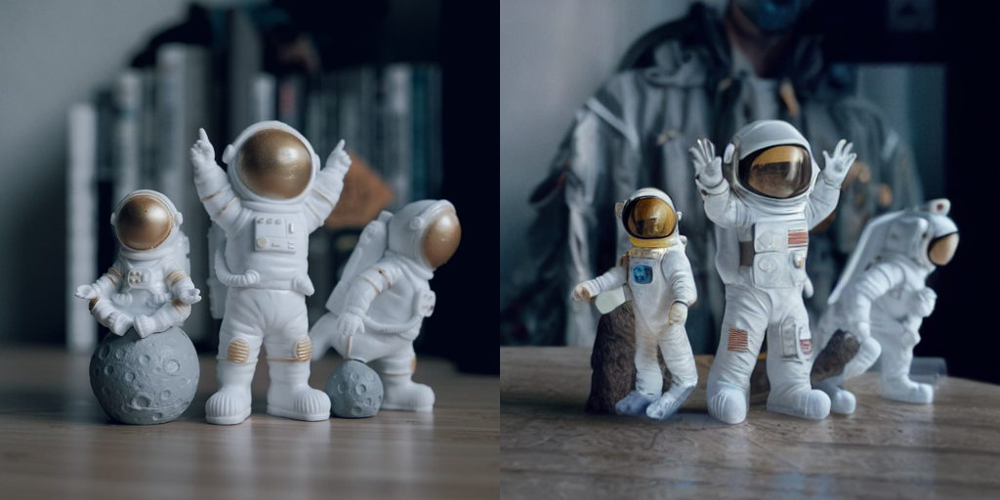

In [ ]:
prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

generator = torch.Generator(device="cuda").manual_seed(0)
image = img2img_pipe_sd15(prompt,
                       image=astro_img,
                       strength=0.5,
                       generator=generator).images[0]
make_image_grid([astro_img, image], rows=1, cols=2)

  0%|          | 0/30 [00:00<?, ?it/s]

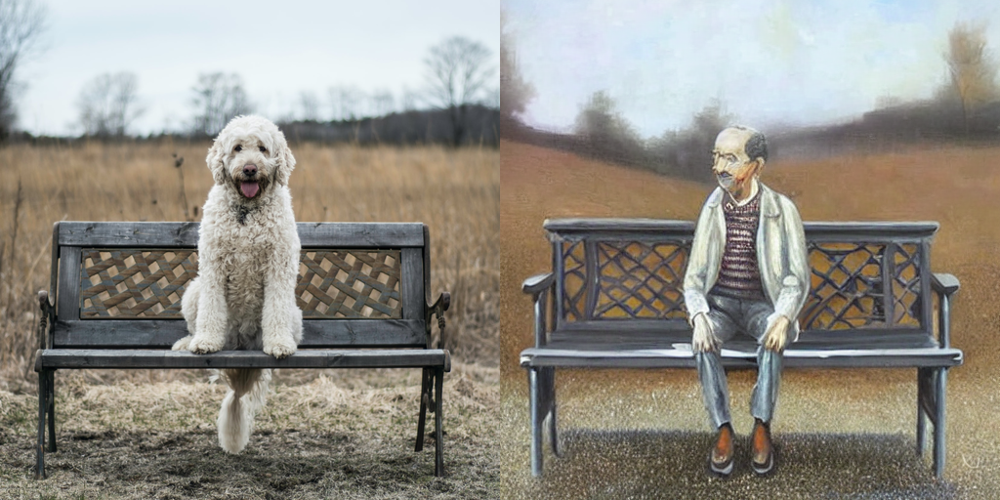

In [ ]:
prompt = "An oil painting of a man on a bench"

generator = torch.Generator(device="cuda").manual_seed(8)
image = img2img_pipe_sd15(prompt,
                       image=bench_dog_img,
                       strength=0.6,
                       generator=generator).images[0]
make_image_grid([bench_dog_img, image], rows=1, cols=2)

### Stable Diffusion XL 1.0

- 2023년 7월 릴리즈 된 모델로 'XL' 모델은 더 큰 파라미터와 데이터셋을 사용하여 학습되었으며, 복잡한 이미지와 고해상도 이미지를 더 잘 생성

- 생성 이미지 크기 1024x1024

- 발표 논문: https://arxiv.org/abs/2307.01952

In [ ]:
img2img_pipe_sdxl = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)#.to(device)

img2img_pipe_sdxl.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

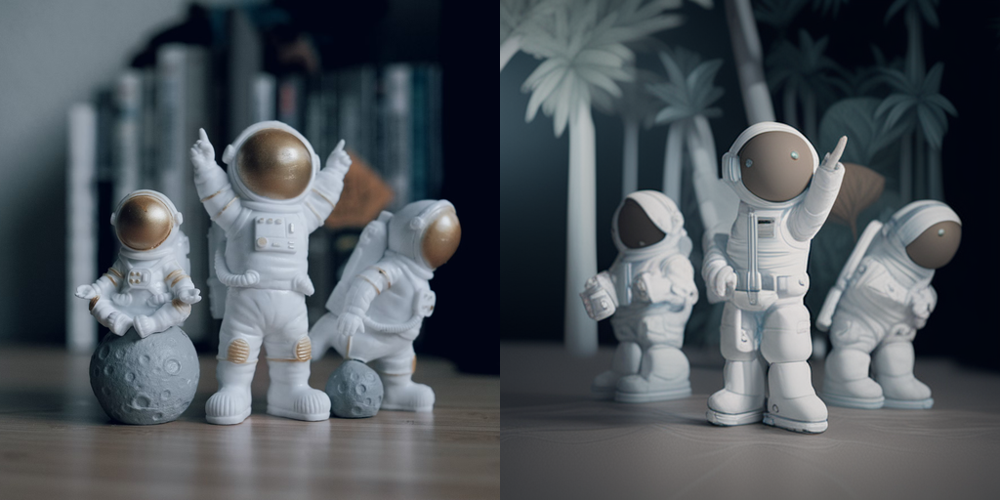

In [ ]:
prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

generator = torch.Generator(device="cuda").manual_seed(15)
image = img2img_pipe_sdxl(prompt,
                       image=astro_img,
                       strength=0.5,
                       generator=generator).images[0]
make_image_grid([astro_img, image], rows=1, cols=2)

---

<font color="red" size=4>여기서 커널(런타임) 리스타트하고 모듈 임포트, 이미지 준비 부분 다시 실행하고 계속하기</font>

## Inpainting

### Using General Checkpoint

- Img2Img에서 처럼 특별히 학습되지 않은 모델을 사용하여 인페인팅 시도

- 추가로 제공된 마스크 이미지의 마스킹 영역(지워내야하는)은 생성된 이미지를 가져오고, 남겨야 하는 영역은 제공된 초기 이미지에서 가져오는 방식으로 인페인팅 수행



In [ ]:
inpaint_pipe_sd15 = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
)#.to(device)

inpaint_pipe_sd15.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/metamath/miniconda3/envs/ai/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

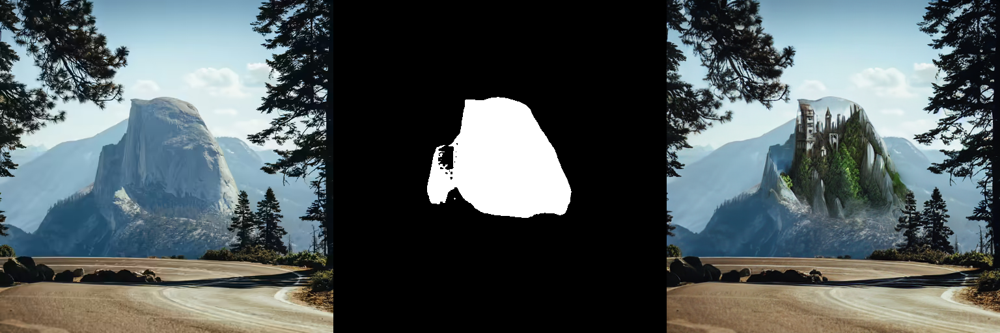

In [ ]:
prompt = "concept art digital painting of an elven castle, \
inspired by lord of the rings, highly detailed, 8k"

generator = torch.Generator("cuda").manual_seed(92)
image = inpaint_pipe_sd15(
    prompt=prompt,
    image=mountain_img,
    mask_image=mountain_mask,
    generator=generator).images[0]

make_image_grid([mountain_img, mountain_mask, image], rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

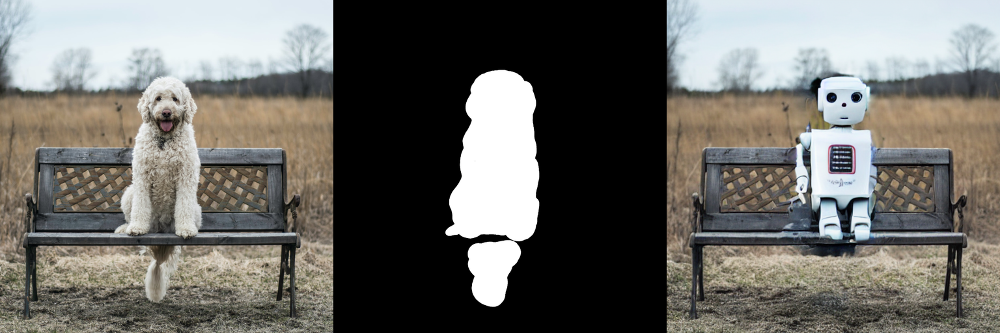

In [ ]:
prompt = "A small robot, high resolution, sitting on a park bench"

generator = torch.Generator("cuda").manual_seed(3)
image = inpaint_pipe_sd15(
    prompt=prompt,
    image=bench_dog_img,
    mask_image=bench_dog_mask,
    generator=generator).images[0]

make_image_grid([bench_dog_img, bench_dog_mask, image], rows=1, cols=3)

### Using Inpaint Checkpoint

#### Stable Diffusion 1.5 Inpaint

- 인페인트 전용으로 따로 학습한 SD 1.5 모델

- 인페인트를 위해 U-Net에 추가 5채널을 입력하는데 4채널은 base image용 1채널은 mask 이미지 용

- 학습시는 자동으로 생성되는 임의의 마스크 이미지와 학습에 사용하는 이미지를 컨디션으로 주고 학습

- 이 과정을 통해 마스킹 된 영역을 프롬프트에 맞게 수정할 수 있게 됨

In [ ]:
# Load the inpainting pipeline (requires a suitable inpainting model)
# 이 모델은 더이상 서비스 하지 않는것 같음 허깅페이스에서 모델카드 찾을 수 없음
inpaint_pipe_sd15_ip = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16,
    variant="fp16"
)
inpaint_pipe_sd15_ip.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/metamath/miniconda3/envs/ai/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

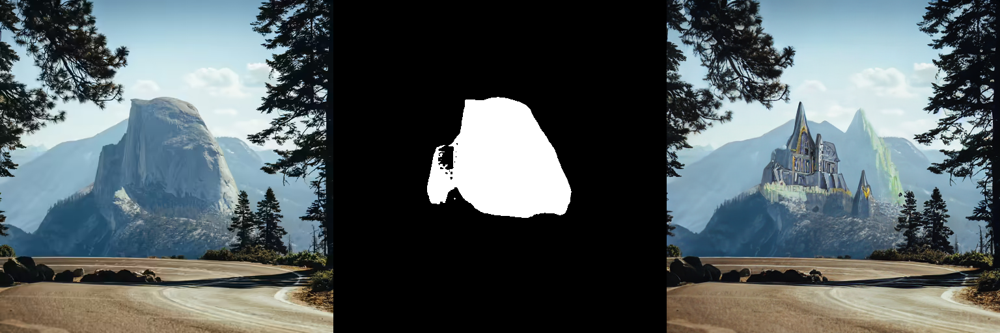

In [ ]:
prompt = "concept art digital painting of an elven castle, \
inspired by lord of the rings, highly detailed, 8k"

generator = torch.Generator("cuda").manual_seed(92)
image = inpaint_pipe_sd15_ip(
    prompt=prompt,
    image=mountain_img,
    mask_image=mountain_mask,
    generator=generator).images[0]

make_image_grid([mountain_img, mountain_mask, image], rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

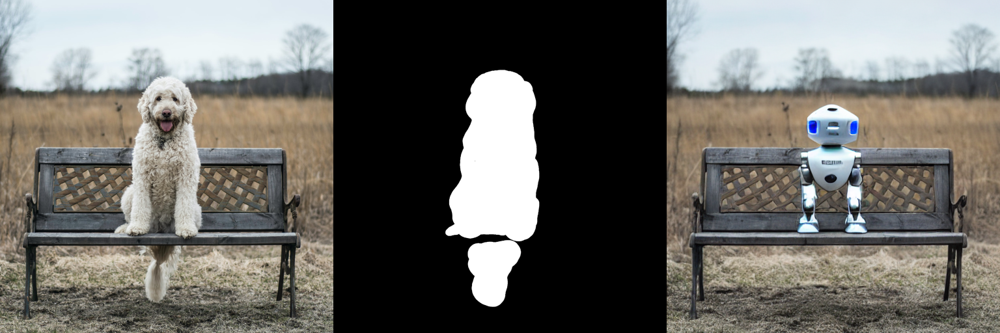

In [ ]:
prompt = "A small robot, high resolution, sitting on a park bench"

generator = torch.Generator("cuda").manual_seed(0)
image = inpaint_pipe_sd15_ip(
    prompt=prompt,
    image=bench_dog_img,
    mask_image=bench_dog_mask,
    generator=generator).images[0]

make_image_grid([bench_dog_img, bench_dog_mask, image], rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

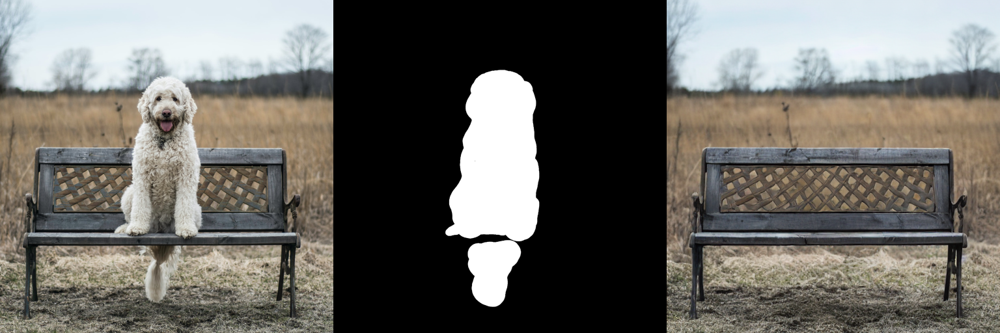

In [ ]:
prompt = "seamless background continuation"

generator = torch.Generator("cuda").manual_seed(3)
image = inpaint_pipe_sd15_ip(
    prompt=prompt,
    image=bench_dog_img,
    mask_image=bench_dog_mask,
    # generator=generator
).images[0]

make_image_grid([bench_dog_img, bench_dog_mask, image], rows=1, cols=3)

#### Stable Diffusion XL Inpaint

In [ ]:
inpaint_pipe_sdxl_ip = AutoPipelineForInpainting.from_pretrained(
    "diffusers/stable-diffusion-xl-1.0-inpainting-0.1",
    torch_dtype=torch.float16, variant="fp16")#.to(device)

# 앞에 모델이 많이 로딩되어있으면
# 여기서 다운됨,
# enable_model_cpu_offload()하지 않고 to(device)하면 괜찮음
inpaint_pipe_sdxl_ip.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'decay': 0.9999, 'inv_gamma': 1.0, 'min_decay': 0.0, 'optimization_step': 37000, 'power': 0.6666666666666666, 'update_after_step': 0, 'use_ema_warmup': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.


  0%|          | 0/18 [00:00<?, ?it/s]

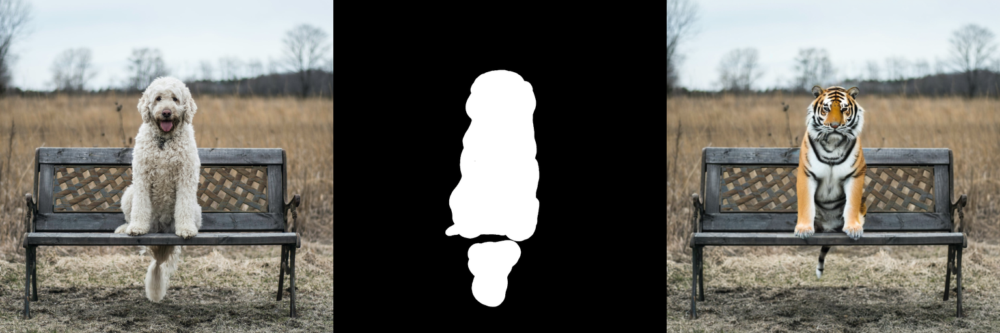

In [ ]:
prompt = "a tiger sitting on a park bench"
generator = torch.Generator(device="cuda").manual_seed(7)

image = inpaint_pipe_sdxl_ip(
  prompt=prompt,
  image=bench_dog_img,
  mask_image=bench_dog_mask,
  guidance_scale=8.0,
  num_inference_steps=20,  # steps between 15 and 30 work well for us
  strength=0.9,  # make sure to use `strength` below 1.0
  generator=generator,
).images[0]

make_image_grid([bench_dog_img, bench_dog_mask, image.resize((512,512))], rows=1, cols=3)

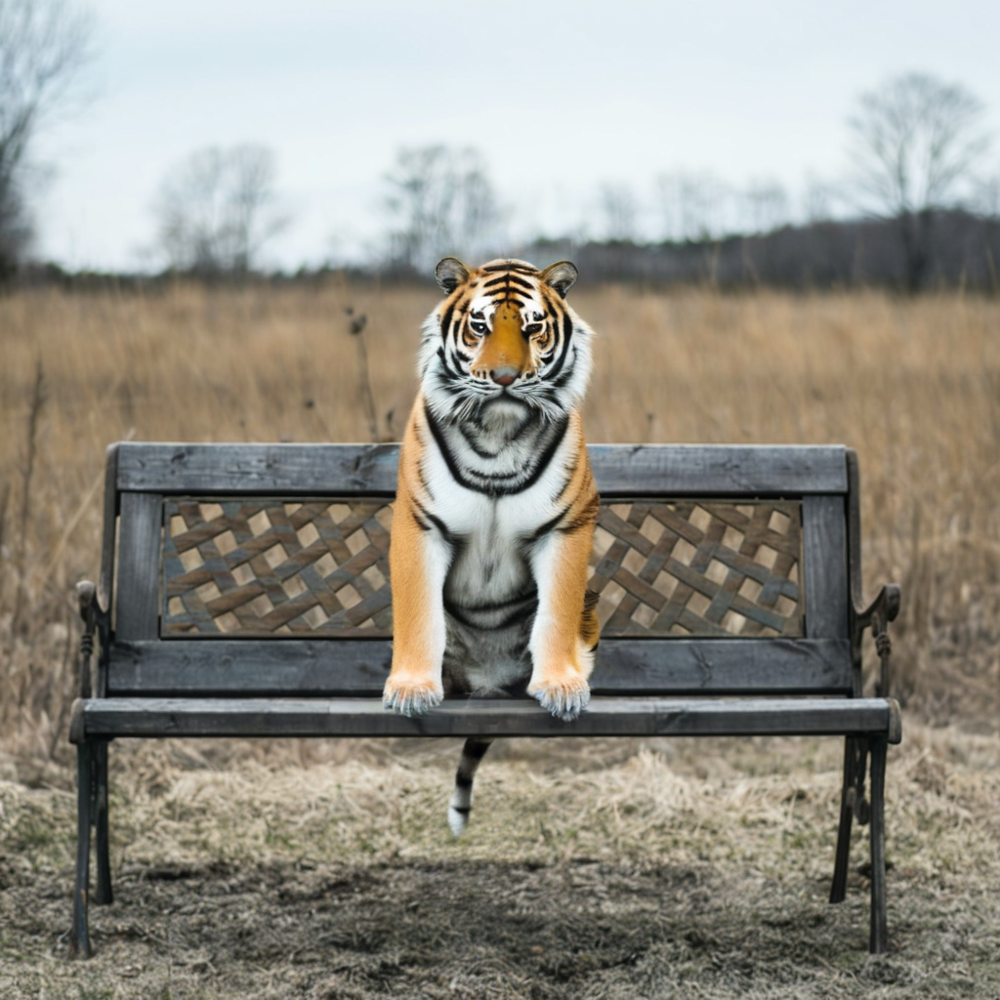

In [ ]:
image

  0%|          | 0/49 [00:00<?, ?it/s]

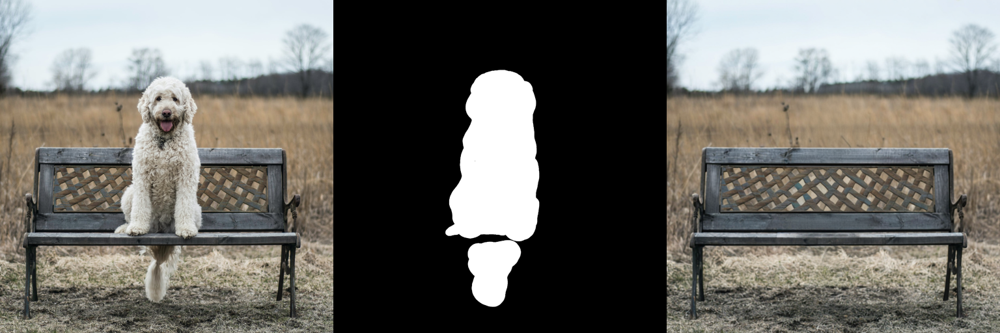

In [ ]:
prompt = "seamless background continuation"
# generator = torch.Generator(device="cuda").manual_seed(3)

image = inpaint_pipe_sdxl_ip(
    prompt=prompt,
    image=bench_dog_img,
    mask_image=bench_dog_mask,
    # generator=generator
).images[0]

make_image_grid([bench_dog_img, bench_dog_mask, image.resize((512,512))], rows=1, cols=3)

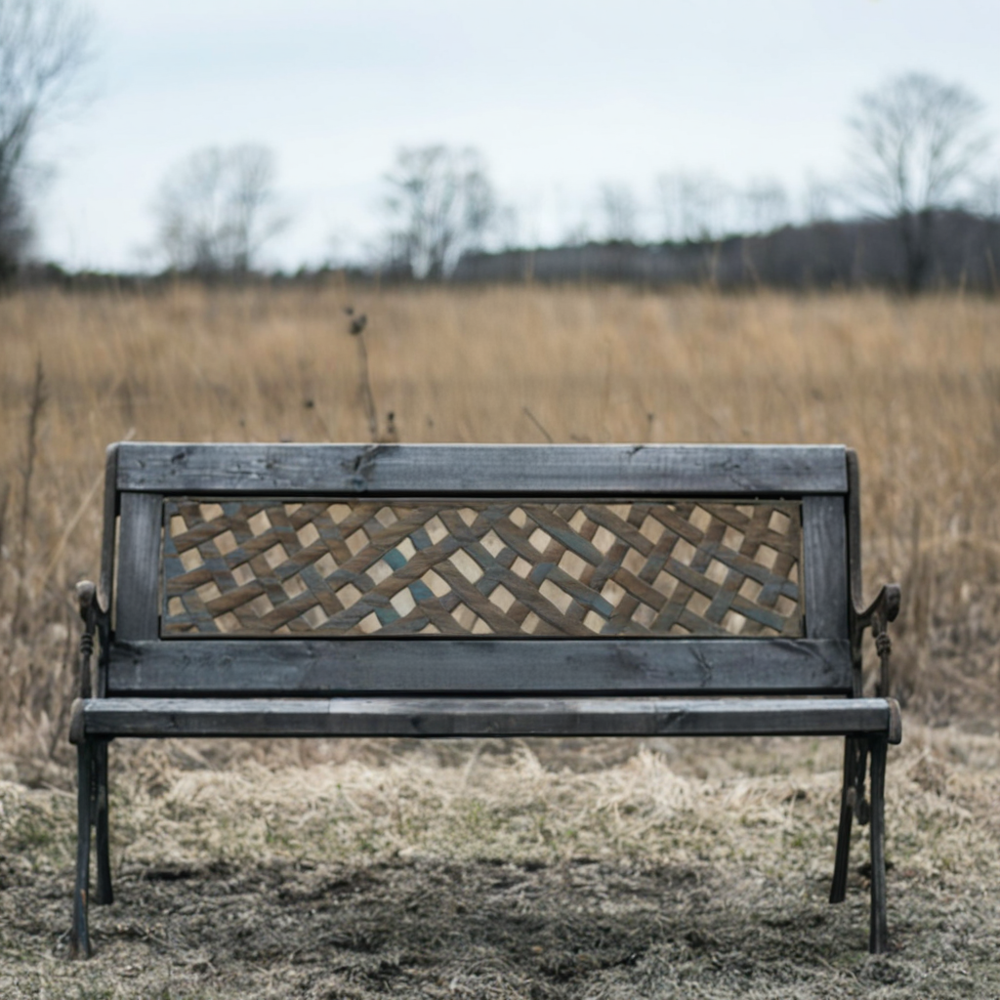

In [ ]:
image